## Part I : Global includes



In [1]:

%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import os
import pathlib
from matplotlib import pyplot as plt
import torch
import numpy as np
import cv2
import tensorflow as tf

# Uncomment to disable GPU usage.
# This is required for some models like Pridnet which has too many traininable parameters
tf.config.set_visible_devices([], 'GPU')

from tqdm.notebook import tqdm
import random

import data_importer

In [2]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

## Part II : Loading test images

In [3]:
#from sklearn.model_selection import train_test_split
from data_importer import load_training_images

noisy_array, gt_array = load_training_images('../../../../Dataset/LowDoseCTGrandChallenge/Training_Image_Data/', load_limited_images=True, num_images_to_load=10)

_n, _g = load_training_images('../../../../Dataset/LowDoseCTGrandChallenge/Selected_Image_Pairs/', load_limited_images=False)

noisy_array = np.concatenate((noisy_array, _n), axis=0)
gt_array = np.concatenate((gt_array, _g), axis=0)

extended_noisy_array, extended_gt_array = load_training_images('../../../../Dataset/LowDoseCTGrandChallenge/Training_Image_Data/', load_limited_images=True, num_images_to_load=500)

loaded training images x and y of len :  10 10  respectively
type of train images x :  float64
range of values in train images :  -0.017142857142857144 1.6685714285714286
type of train images y :  float64
loaded training images x and y of len :  3 3  respectively
type of train images x :  float64
range of values in train images :  -0.017142857142857144 1.897857142857143
type of train images y :  float64
loaded training images x and y of len :  500 500  respectively
type of train images x :  float64
range of values in train images :  -0.017142857142857144 1.6685714285714286
type of train images y :  float64


Visualization of the noisy / ground truth image pair

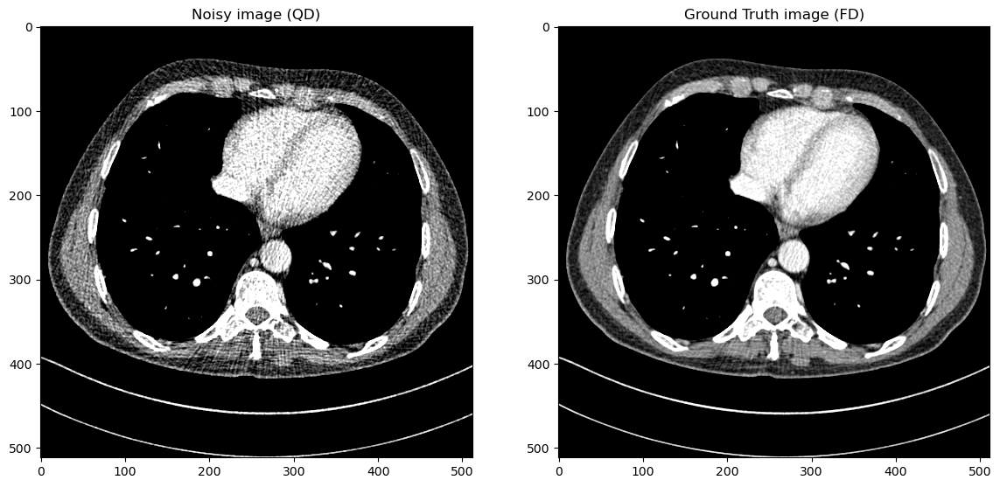

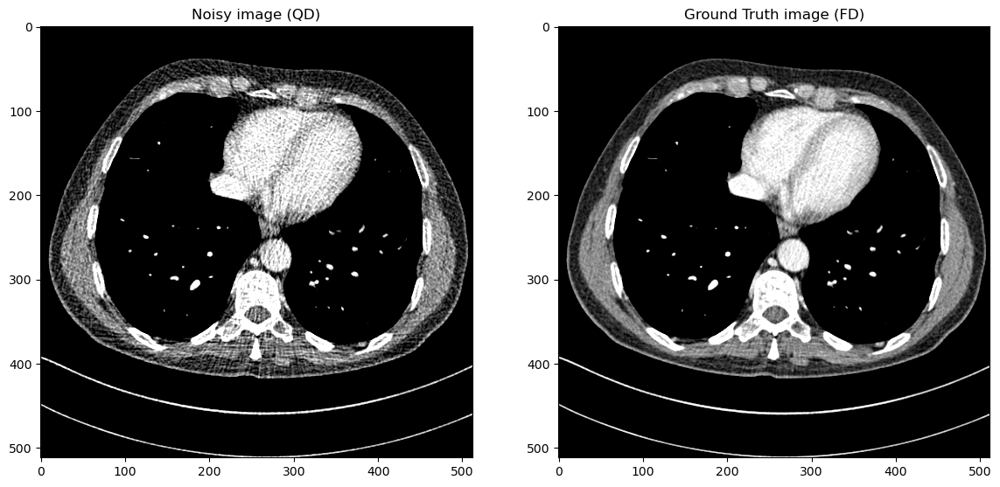

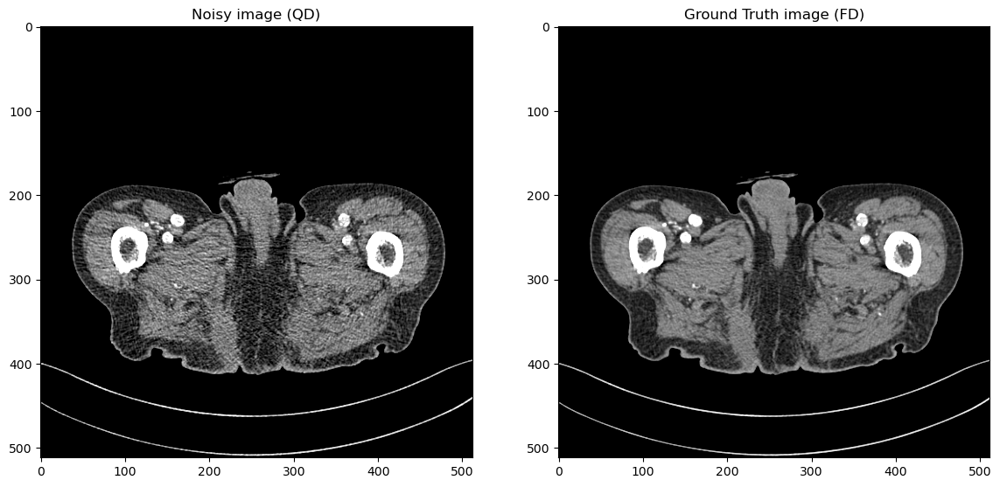

In [4]:
from data_importer import denormalize, trunc

for i in range(6, 14, 3):
    f, axarr = plt.subplots(1,2, figsize=(14,14))
    axarr[0].imshow(trunc(denormalize(noisy_array[i])), vmin=-160.0, vmax=240.0, cmap='gray')
    axarr[0].set_title("Noisy image (QD)")
    axarr[1].imshow(trunc(denormalize(gt_array[i])), vmin=-160.0, vmax=240.0, cmap='gray')
    axarr[1].title.set_text("Ground Truth image (FD)")
    plt.show()

### Part III : Setup for Inference

In [5]:
# Inference
def inference_single_image(model, noisy_image):
    input_image = np.expand_dims(noisy_image, axis=0)
    predicted_image = model.predict(input_image)
    a = np.abs(np.min(predicted_image))
    b = np.max(predicted_image)
    
    #predicted_image = predicted_image * (b - a) + a
    return predicted_image[0]

def inference_batch_images(model, noisy_images):
    input_image = noisy_images

    predicted_image = model.predict(input_image).astype(np.float64)
    return predicted_image

In [6]:
def rgb2gray(rgb):
    return np.expand_dims(np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140]), axis=-1)

from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio
import sys
sys.path.append('../')

from metrics import compute_SSIM, compute_PSNR
from skimage.metrics import mean_squared_error  as mse

def calculate_psnr(original_image, reconstructed_image,range=400):
    return peak_signal_noise_ratio(original_image, reconstructed_image,data_range=range) 

    psnr_value = peak_signal_noise_ratio(original_image, reconstructed_image, data_range=240+160)
    return psnr_value

def calculate_ssim(original_image, reconstructed_image, range=400.0):    
    ssim_value = ssim(original_image.astype(np.int16), reconstructed_image.astype(np.int16), win_size=11, channel_axis=2, data_range=range)
    return ssim_value

def calculate_rmse(original_image, reconstructed_image):
    return mse(original_image, reconstructed_image)

def visualize_predictions(model, X_test, y_test, n, predictions, model_name):
    random_numbers = list(range(n)) # not very random
    for i in random_numbers:
        noisy_image = X_test[i].astype(np.float16)
        gt_image = y_test[i].astype(np.float16)
        predicted_image = predictions[i].astype(np.float16)

        if predicted_image.shape[-1] == 3:
            predicted_image = rgb2gray(predicted_image)
                                
            
        psnr_recon =  calculate_psnr(trunc(denormalize(gt_image)), trunc(denormalize(predicted_image)))
        psnr_qd =  calculate_psnr(trunc(denormalize(gt_image)),  trunc(denormalize(noisy_image)))
        ssim_recon = calculate_ssim(trunc(denormalize(gt_image)),  trunc(denormalize(predicted_image)))
        ssim_qd =calculate_ssim(trunc(denormalize(gt_image)), trunc(denormalize(noisy_image)))
        rmse_recon = calculate_rmse(trunc(denormalize(gt_image)),  trunc(denormalize(predicted_image)))
        rmse_qd=calculate_rmse(trunc(denormalize(gt_image)), trunc(denormalize(noisy_image)))
        
        psnr_recon = round(psnr_recon, 4)
        psnr_qd = round(psnr_qd, 4)
        ssim_recon = round(ssim_recon, 4)
        ssim_qd = round(ssim_qd, 4)
        rmse_recon = round(rmse_recon, 4)
        rmse_qd = round(rmse_qd, 4)
        
        f, axarr = plt.subplots(1,3, figsize=(21,21))

        axarr[0].imshow(trunc(denormalize(noisy_image)), cmap='gray', vmin=-160.0, vmax=240.0)
        axarr[0].set_title("QD Image : PSNR={}\nSSIM={}\nRMSE={}".format(psnr_qd, ssim_qd, rmse_qd))
        axarr[0].set_axis_off()
        axarr[1].imshow(trunc(denormalize(gt_image)),  cmap='gray', vmin=-160.0, vmax=240.0)
        axarr[1].set_title("FD Image")
        axarr[1].set_axis_off()
        axarr[2].imshow(trunc(denormalize(predicted_image)), cmap='gray', vmin=-160.0, vmax=240.0)
        axarr[2].set_title("{} Predicted Image : PSNR={}\nSSIM={}\nRMSE={}".format(model_name, psnr_recon, ssim_recon, rmse_recon))
        axarr[2].set_axis_off()
        
        plt.show()

In [7]:
from skimage.metrics import peak_signal_noise_ratio

def get_average_metrics(predicted_images, _gt_array, _noisy_array):
    psnr_original_mean = 0
    psnr_prediction_mean = 0

    ssim_original_mean = 0
    ssim_prediction_mean = 0

    mse_original_mean = 0
    mse_prediction_mean = 0

    varience_of_laplacian = 0

    if np.all(_gt_array) != None:
        gt_array = _gt_array
        noisy_array = _noisy_array
        

    i = 0
    for gt_img, noisy_img, predicted_img in zip(gt_array, noisy_array, predicted_images):
        predicted_img=  predicted_images[i]
        if predicted_img.shape[-1] == 3:
            predicted_img = rgb2gray(predicted_img)
            
        copy_pred_img = np.squeeze(predicted_img, axis=-1)
        print(copy_pred_img.dtype, copy_pred_img.shape)
        ddtype = None
        if copy_pred_img.dtype == np.float64:
            ddtype = cv2.CV_64F
        else:
            ddtype = cv2.CV_32F

        varience_of_laplacian +=  cv2.Laplacian(copy_pred_img, ddtype).var()

        psnr_recon =  calculate_psnr(trunc(denormalize(gt_img)), trunc(denormalize(predicted_img)))
        psnr_qd =  calculate_psnr(trunc(denormalize(gt_img)),  trunc(denormalize(noisy_img)))
        ssim_recon = calculate_ssim(trunc(denormalize(gt_img)),  trunc(denormalize(predicted_img)))
        ssim_qd =calculate_ssim(trunc(denormalize(gt_img)), trunc(denormalize(noisy_img)))
        rmse_recon = calculate_rmse(trunc(denormalize(gt_img)),  trunc(denormalize(predicted_img)))
        rmse_qd=calculate_rmse(trunc(denormalize(gt_img)), trunc(denormalize(noisy_img)))

        psnr_original_mean += psnr_qd
        psnr_prediction_mean += psnr_recon
        
        ssim_original_mean += ssim_qd
        ssim_prediction_mean += ssim_recon

        mse_original_mean += rmse_qd
        mse_prediction_mean += rmse_recon
        
        i = i + 1        
    
    psnr_original_mean/=gt_array.shape[0]
    psnr_prediction_mean/=gt_array.shape[0]

    ssim_original_mean/=gt_array.shape[0]
    ssim_prediction_mean/=gt_array.shape[0]

    mse_original_mean/=gt_array.shape[0]
    mse_prediction_mean/=gt_array.shape[0]
    
    print("Original average gt-noisy PSNR ->", psnr_original_mean)
    print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

    print("Original average gt-noisy SSIM ->", ssim_original_mean)
    print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)

    print("Original average gt-noisy MSE->", mse_original_mean)
    print("Predicted average gt-predicted MSE->", mse_prediction_mean)

    print('VAL : ', varience_of_laplacian)
    
    return round(psnr_prediction_mean, 4), round(ssim_prediction_mean, 4), round(mse_prediction_mean, 4), round(psnr_prediction_mean - psnr_original_mean, 4), round(ssim_prediction_mean - ssim_original_mean, 4), round(mse_prediction_mean - mse_original_mean, 4), varience_of_laplacian


## Part IV : Evaluation of each model

## Model 1 : Hformer (for base reference)

In [8]:
def reconstruct_image_from_patches(patches, num_patches_per_row):
    patch_size = patches.shape[1]  # Assuming square patches
    num_patches = patches.shape[0]

    # Calculate the number of rows
    num_patches_per_col = num_patches // num_patches_per_row

    # Initialize an empty image to store the reconstructed result
    reconstructed_image = np.zeros((num_patches_per_col * patch_size, num_patches_per_row * patch_size))

    # Reshape the patches into a 2D array
    patches_2d = patches.reshape((num_patches_per_col, num_patches_per_row, patch_size, patch_size))
    # Reconstruct the image by placing each patch in its corresponding position

    for i in range(num_patches_per_col):
        for j in range(num_patches_per_row):
            reconstructed_image[i * patch_size:(i + 1) * patch_size, j * patch_size:(j + 1) * patch_size] = patches_2d[i, j]

    return np.expand_dims(reconstructed_image, axis=-1)

In [10]:
# View the predictions
sys.path.append('../denoising-models/hformer_vit/model/')
sys.path.append('../denoising-models/hformer_vit/')
from hformer_model_extended import get_hformer_model, PatchExtractor
patch_extractor = PatchExtractor(patch_size=64, stride=64, name="patch_extractor")
noisy_image_patches_array = patch_extractor(noisy_array)
extended_noisy_image_patches_array = patch_extractor(extended_noisy_array)


# Model 5 : W Model

In [11]:

sys.path.append('../denoising-models/hformer_pytorch')
from torchinfo import summary

from w_model import WModel 

w_model = WModel(num_channels=32).cuda()
w_model.load_state_dict(torch.load('../denoising-models/hformer_pytorch/weights/model_278.pth'))
w_model.eval()
print('model summary\n', summary(w_model, input_size=(64, 64, 64, 1)))

Using cache found in C:\Users\Tarun/.cache\torch\hub\mateuszbuda_brain-segmentation-pytorch_master
Using cache found in C:\Users\Tarun/.cache\torch\hub\mateuszbuda_brain-segmentation-pytorch_master


model summary
Layer (type:depth-idx)                   Output Shape              Param #
WModel                                   [64, 64, 64, 1]           --
├─InputProjectionLayer: 1-1              [64, 32, 64, 64]          --
│    └─Conv2d: 2-1                       [64, 32, 64, 64]          320
├─UNet: 1-2                              [64, 32, 64, 64]          --
│    └─Sequential: 2-2                   [64, 32, 64, 64]          --
│    │    └─Conv2d: 3-1                  [64, 32, 64, 64]          9,216
│    │    └─BatchNorm2d: 3-2             [64, 32, 64, 64]          64
│    │    └─ReLU: 3-3                    [64, 32, 64, 64]          --
│    │    └─Conv2d: 3-4                  [64, 32, 64, 64]          9,216
│    │    └─BatchNorm2d: 3-5             [64, 32, 64, 64]          64
│    │    └─ReLU: 3-6                    [64, 32, 64, 64]          --
│    └─MaxPool2d: 2-3                    [64, 32, 32, 32]          --
│    └─Sequential: 2-4                   [64, 64, 32, 32]       

In [12]:


# W model with wavelet
from pytorch_wavelets import DTCWTForward, DTCWTInverse
dwt = DTCWTForward(J=3).cuda()
idwt = DTCWTInverse().cuda()
wavelet_w_model_prediction_patches =[]


with torch.no_grad():
    for i in range(extended_noisy_image_patches_array.shape[0] // 64):
        noisy = extended_noisy_image_patches_array[i * 64 : i * 64 + 64]
        noisy = torch.from_numpy(noisy.cpu().numpy()).to('cuda')
        prediction = w_model(noisy)

        prediction_img = torch.transpose(prediction, 1, 3)
        transposed_noisy_image = torch.transpose(noisy, 1, 3)

        prediction_approx, prediction_high_freq = dwt(prediction_img.cuda())
        prediction_high_freq_low, prediction_high_freq_mid, prediction_high_freq_coarse = prediction_high_freq[0], prediction_high_freq[1], prediction_high_freq[2]

        noisy_approx, noisy_high_freq = dwt(transposed_noisy_image.cuda())

        noisy_high_freq_fine, noisy_high_freq_mid, noisy_high_freq_coarse = noisy_high_freq[0], noisy_high_freq[1] , noisy_high_freq[2]

        reconstructed_prediction_image_with_high_freq_swap = idwt((noisy_approx, noisy_high_freq))
        reconstructed_prediction_image_with_high_freq_swap = torch.transpose(reconstructed_prediction_image_with_high_freq_swap, 3, 1)


        #denoise_high_freq = torch.transpose(torch.from_numpy(denoised_high_freq), 1, 3)
        #denoised_noisy_approx, denoised_high_freq = dwt(denoise_high_freq.cuda())
        #noisy_high_freq_fine, noisy_high_freq_mid, noisy_high_freq_coarse = denoised_high_freq[0], denoised_high_freq[1] , denoised_high_freq[2]

        wavelet_high_freq_swapped = [None] * 3
        wavelet_high_freq_swapped[0] =noisy_high_freq_fine
        wavelet_high_freq_swapped[1] =prediction_high_freq_mid
        wavelet_high_freq_swapped[2] =prediction_high_freq_coarse

        reconstructed_prediction_image = idwt((prediction_approx,wavelet_high_freq_swapped))
        reconstructed_prediction_image = torch.transpose(reconstructed_prediction_image, 1, 3)
        wavelet_w_model_prediction_patches.append(reconstructed_prediction_image.detach().cpu().numpy())

wavelet_w_predictions = [None] * extended_noisy_array.shape[0]
def reconstruct(patches,  num_images):
    num_patches_per_image = patches.shape[0] // num_images
    for i in range(num_images):
        
        image_patches = patches[i * num_patches_per_image:i * num_patches_per_image + num_patches_per_image]
        
        reconstruct_image = (reconstruct_image_from_patches(image_patches, 8))
        wavelet_w_predictions[i]  = reconstruct_image
wavelet_w_model_prediction_patches = np.concatenate(wavelet_w_model_prediction_patches)
print(wavelet_w_model_prediction_patches.shape)
reconstruct(wavelet_w_model_prediction_patches, extended_gt_array.shape[0])


Instructions for updating:
Use tf.identity instead.
(32000, 64, 64, 1)


## Part V : Side by side comparison of all models

In [13]:
from prettytable import PrettyTable

pt = PrettyTable()
pt.field_names = ["Model", "PSNR", "SSIM", "MSE", "PSNR Improvement", "SSIM improvement", "MSE Improvement", "Varience of Laplacian"]

w_metrics = get_average_metrics(wavelet_w_predictions, extended_gt_array, extended_noisy_array)

float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512, 512)
float64 (512

In [14]:

pt.add_row(["Original X-y pairs (No Model)","21.97","0.78911", '-', '-', "-", "-", "-"])
pt.add_row(["W Model",str(w_metrics[0]), str(w_metrics[1]), str(round(w_metrics[2], 4)), str(round(w_metrics[3], 4)), str(round(w_metrics[4] * 100, 4)), str(w_metrics[5]) + '%', str(w_metrics[6])])

print(pt)

+-------------------------------+---------+---------+----------+------------------+------------------+-----------------+-----------------------+
|             Model             |   PSNR  |   SSIM  |   MSE    | PSNR Improvement | SSIM improvement | MSE Improvement | Varience of Laplacian |
+-------------------------------+---------+---------+----------+------------------+------------------+-----------------+-----------------------+
| Original X-y pairs (No Model) |  21.97  | 0.78911 |    -     |        -         |        -         |        -        |           -           |
|            W Model            | 22.3276 |  0.685  | 962.9897 |      2.064       |       6.71       |    -587.4701%   |   2.2216949540414412  |
+-------------------------------+---------+---------+----------+------------------+------------------+-----------------+-----------------------+


## Part 6 : Output of predictions of all 4 models side by side for direct visualize comparison

In [23]:
def visualize_predictions_all_models(X_test, y_test, n, hformer_predictions, x_predictions, y_predictions, sa_predictions, z_predictions, w_predictions):
    random_numbers = list(range(n))  # not very random
    for i in random_numbers:
        noisy_image = X_test[i]
        gt_image = y_test[i]

        hformer_pred = hformer_predictions[i]
        x_pred = x_predictions[i]
        y_pred = y_predictions[i]
        sa_pred = sa_predictions[i]
        z_pred = z_predictions[i]
        w_pred = w_predictions[i]

        models = ["HFORMER", "X", "Y", "SA",  "Z", "W"]
        predictions = [hformer_pred, x_pred, y_pred, sa_pred, z_pred, w_pred]

        # Display QD and FD images
        f, axarr = plt.subplots(1, 2 + len(models), figsize=(41,41))

        psnr_qd =  calculate_psnr(trunc(denormalize(gt_image)),  trunc(denormalize(noisy_image)))
        ssim_qd =calculate_ssim(trunc(denormalize(gt_image)), trunc(denormalize(noisy_image)))
        rmse_qd = calculate_rmse(trunc(denormalize(gt_image)), trunc(denormalize(noisy_image)))

        axarr[0].imshow(trunc(denormalize(noisy_image)), cmap='gray', vmin=-160.0, vmax=240.0)
        axarr[0].set_title("QD Image\nPSNR={}\nSSIM={}\nMSE={}".format(round(psnr_qd, 4), round(ssim_qd, 4), round(rmse_qd, 4)))

        axarr[0].set_axis_off()
        axarr[1].imshow(trunc(denormalize(gt_image)), cmap='gray', vmin=-160.0, vmax=240.0)
        axarr[1].set_title("FD Image")
        axarr[1].set_axis_off()

        for j, (model_name, predicted_image) in enumerate(zip(models, predictions), start=2):
            if predicted_image.shape[-1] == 3:
                predicted_image = rgb2gray(predicted_image)

            psnr_recon = calculate_psnr(trunc(denormalize(gt_image)), trunc(denormalize(predicted_image)))
            ssim_recon = calculate_ssim(trunc(denormalize(gt_image)), trunc(denormalize(predicted_image)))
            rmse_recon = calculate_rmse(trunc(denormalize(gt_image)), trunc(denormalize(predicted_image)))

            psnr_recon = round(psnr_recon, 4)
            ssim_recon = round(ssim_recon, 4)
            mse_recon = round(rmse_recon, 4)

            axarr[j].imshow(trunc(denormalize(predicted_image)), cmap='gray', vmin=-160.0, vmax=240.0)
            axarr[j].set_title("{}\nPSNR={}\nSSIM={}\nMSE={}".format(model_name, psnr_recon, ssim_recon, mse_recon))
            axarr[j].set_axis_off()

        plt.savefig('../../output/novel_comparison/combined_outputs_image_index_{}.png'.format(i))
        plt.show()

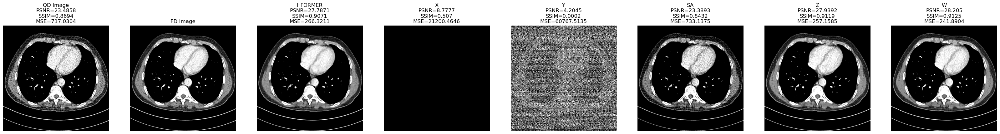

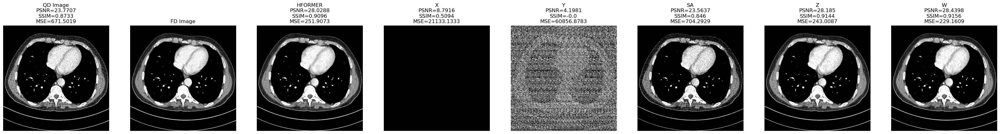

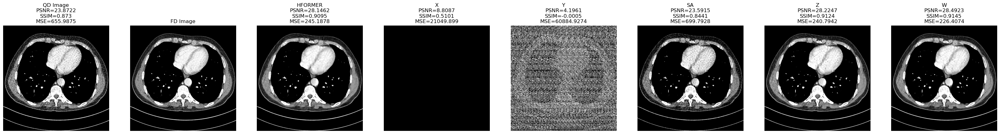

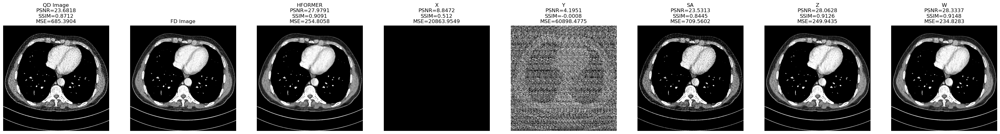

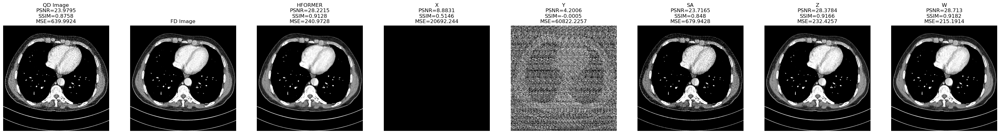

...

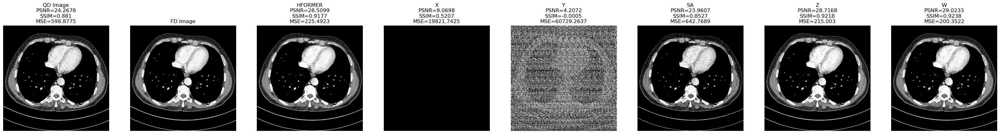

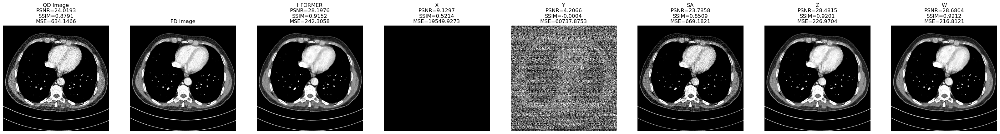

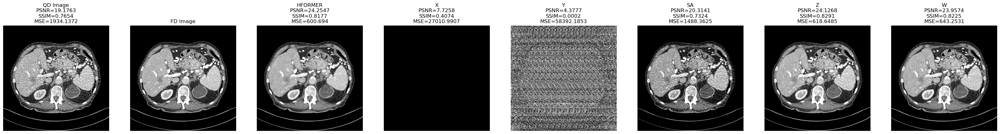

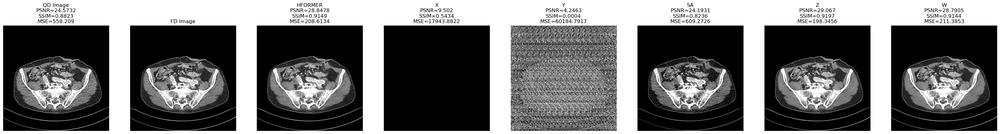

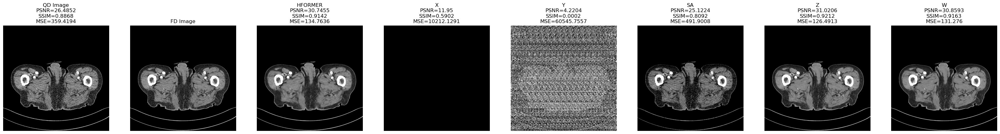

In [24]:

visualize_predictions_all_models(noisy_array, gt_array, len(gt_array), hformer_predictions, np.concatenate(x_model_prediction_patches, axis=0), np.concatenate(y_model_prediction_patches, axis=0), sa_predictions, z_predictions, w_predictions)